In [43]:
import numpy as np
import matplotlib
import matplotlib.pyplot as plt
from matplotlib.pyplot import cm
import re
from datetime import time
from datetime import datetime
import os

from scipy.io import readsav
from scipy import signal

from astropy.time import Time
from astropy.time import TimeDelta

from sunpy import timeseries as ts
from sunpy.net import attrs as a

import pandas as pd

import wget
import goesxrs_temp as gtem #from Ian's functions
import Onsets_temp as onsets

import warnings #Need to remove for future
warnings.filterwarnings("ignore", module="sunpy.timeseries.timeseriesbase")


# Just setup plot fonts
plt.rcParams.update({'font.size': 18,'font.family':"sans-serif",\
                         'font.sans-serif':"Arial",'mathtext.default':"regular", 'axes.linewidth' :2})

In [44]:
odd_data = pd.read_csv("flares to check.csv")
odd_data = odd_data.dropna(subset = ['event_peaktime'])

In [45]:
data_dir = r"D:\MastersProj\Data\goes15"

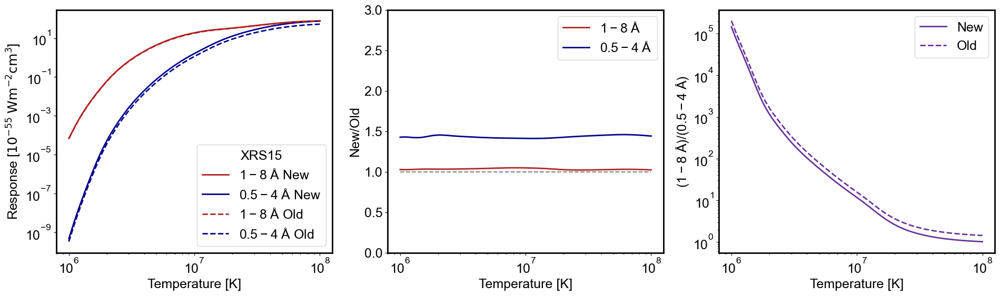

In [46]:
sat = 15
resps_old, resptmk_old = gtem.get_resps(sat=sat,old_ver=True)
resps, resptmk = gtem.get_resps(sat=sat)

# Plot them to see what they look like:
fig= plt.figure(figsize=(23, 6))

ax1 = fig.add_subplot(1, 3, 1)
plt.plot(1e6*resptmk,resps[:,0],marker=None,color='firebrick',lw=2,label='$1-8\;\AA$ New')
plt.plot(1e6*resptmk,resps[:,1],marker=None,color='darkblue',lw=2,label='$0.5-4\;\AA$ New')
plt.plot(1e6*resptmk_old,resps_old[:,0],marker=None,ls='--',color='firebrick',lw=2,label='$1-8\;\AA$ Old')
plt.plot(1e6*resptmk_old,resps_old[:,1],marker=None,ls='--',color='darkblue',lw=2,label='$0.5-4\;\AA$ Old')
ax1.set_ylabel("Response [$\mathrm{10^{-55}\;Wm^{-2}cm^{3}}$]")
ax1.set_xlabel("Temperature [K]")
ax1.set_xscale("log")
ax1.set_yscale("log")
plt.legend(title='XRS{:.0f}'.format(sat))

ax2 = fig.add_subplot(1, 3, 2)
plt.plot(1e6*resptmk,resps[:,0]/resps_old[:,0],marker=None,color='firebrick',lw=2,label='$1-8\;\AA$')
plt.plot(1e6*resptmk,resps[:,1]/resps_old[:,1],marker=None,color='darkblue',lw=2,label='$0.5-4\;\AA$')
plt.plot([1e6*np.min(resptmk),1e6*np.max(resptmk)],[1,1],'--',color='grey')
plt.ylim([0,3])
ax2.set_ylabel("New/Old")
ax2.set_xlabel("Temperature [K]")
ax2.set_xscale("log")
ax2.set_yscale("linear")
plt.legend()


ax3 = fig.add_subplot(1, 3, 3)
plt.plot(1e6*resptmk,resps[:,0]/resps[:,1],marker=None,color='rebeccapurple',lw=2,label='New')
plt.plot(1e6*resptmk,resps_old[:,0]/resps_old[:,1],marker=None,color='rebeccapurple',ls='--',lw=2,label='Old')
ax3.set_ylabel("$(1-8\;\AA)$/$(0.5-4\;\AA)$")
ax3.set_xlabel("Temperature [K]")
ax3.set_xscale("log")
ax3.set_yscale("log")
plt.legend()
plt.show()



------------------------------
M1.9 Flare With Start Time: 2011-02-09 01:23:00.000
---------------------
No Suitable Background Detected... Using a 1 min window starting from start time
---------------------

Not enough troughs for located! To calculate onset!
Going to caculate the onset time to be the first 1/4 of the Impulsive Phase.

T, EM at onset (using averaged flux): 10.17 MK and 0.03x10^49 cm^-3
T, EM at Peak: 14.62 MK and 0.99 x10^49 cm^-3

------------------------------
M1.0 Flare With Start Time: 2011-02-18 10:23:00.000

Not enough troughs for located! To calculate onset!
Going to caculate the onset time to be the first 1/4 of the Impulsive Phase.

T, EM at onset (using averaged flux): 10.73 MK and 0.04x10^49 cm^-3
T, EM at Peak: 10.34 MK and 0.30 x10^49 cm^-3



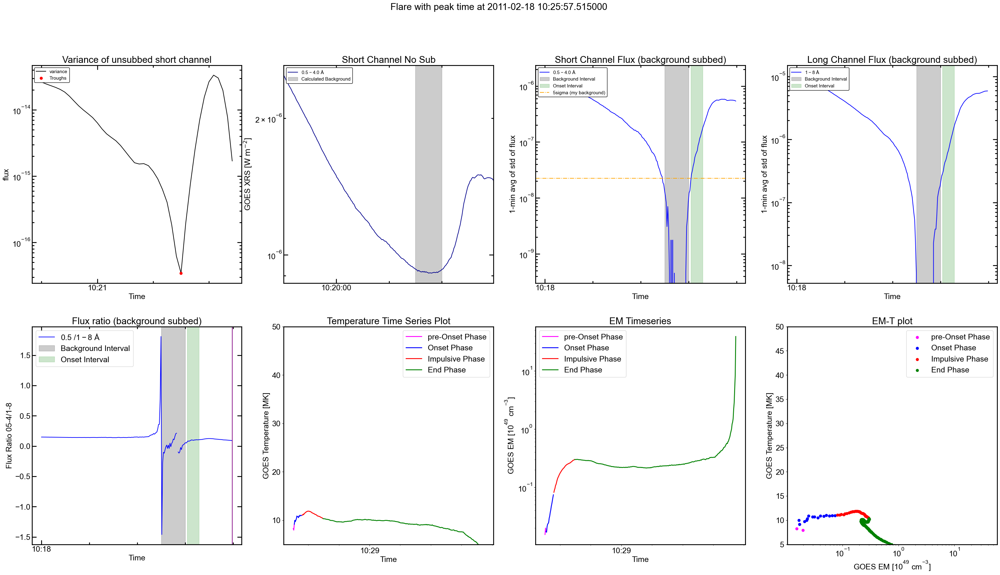

------------------------------
M1.4 Flare With Start Time: 2011-02-18 12:59:00.000

Not enough troughs for located! To calculate onset!
Going to caculate the onset time to be the first 1/4 of the Impulsive Phase.

T, EM at onset (using averaged flux): 14.58 MK and 0.01x10^49 cm^-3
T, EM at Peak: 14.92 MK and 0.69 x10^49 cm^-3

------------------------------
M1.3 Flare With Start Time: 2011-04-15 17:02:00.000

T, EM at onset (using averaged flux): 15.72 MK and 0.02x10^49 cm^-3
T, EM at Peak: 14.25 MK and 0.67 x10^49 cm^-3



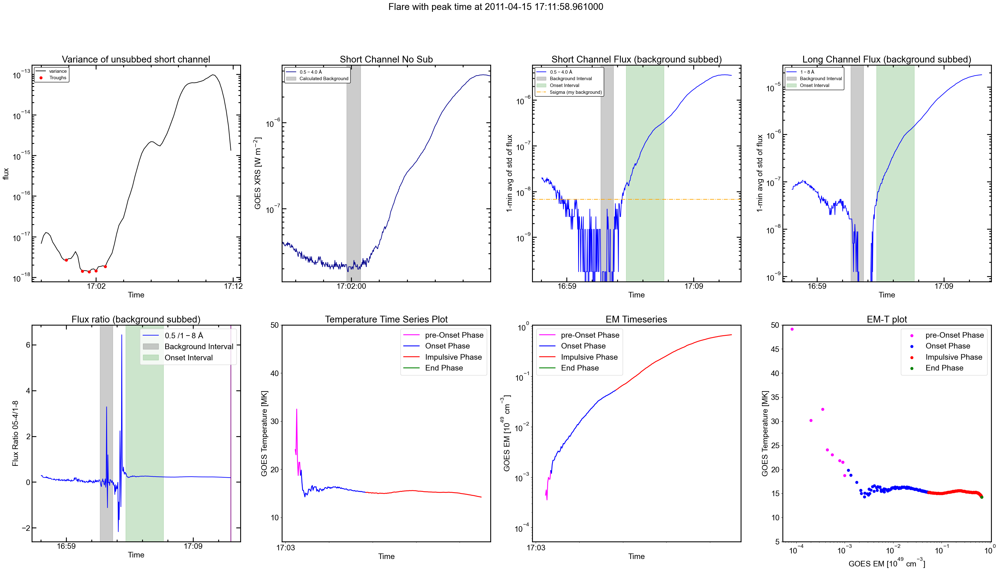

------------------------------
M1.8 Flare With Start Time: 2011-04-22 04:35:00.000

T, EM at onset (using averaged flux): 13.19 MK and 0.16x10^49 cm^-3
T, EM at Peak: 11.97 MK and 1.04 x10^49 cm^-3



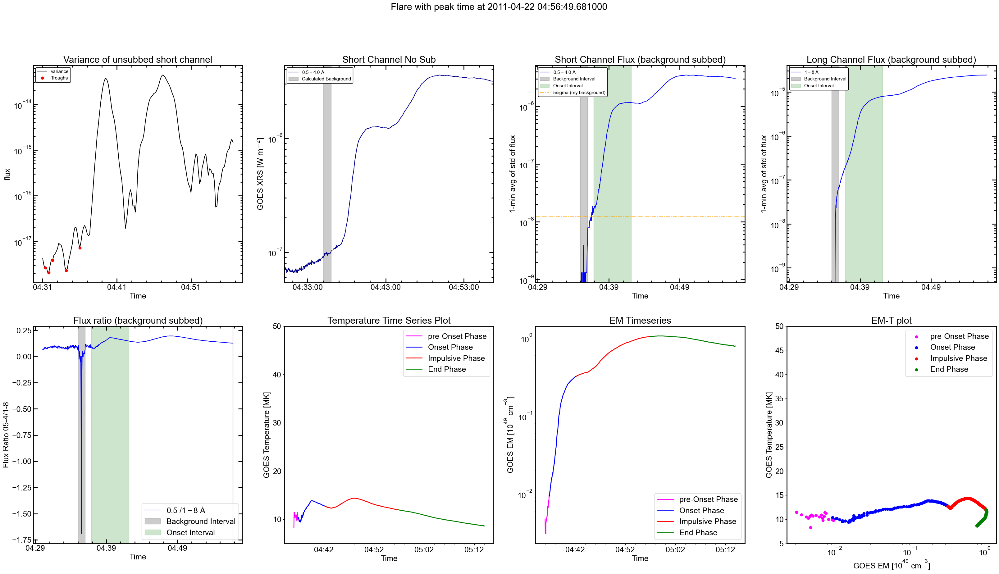

------------------------------
M1.2 Flare With Start Time: 2011-05-28 21:44:00.000

T, EM at onset (using averaged flux): 18.32 MK and 0.02x10^49 cm^-3
T, EM at Peak: 14.14 MK and 0.33 x10^49 cm^-3



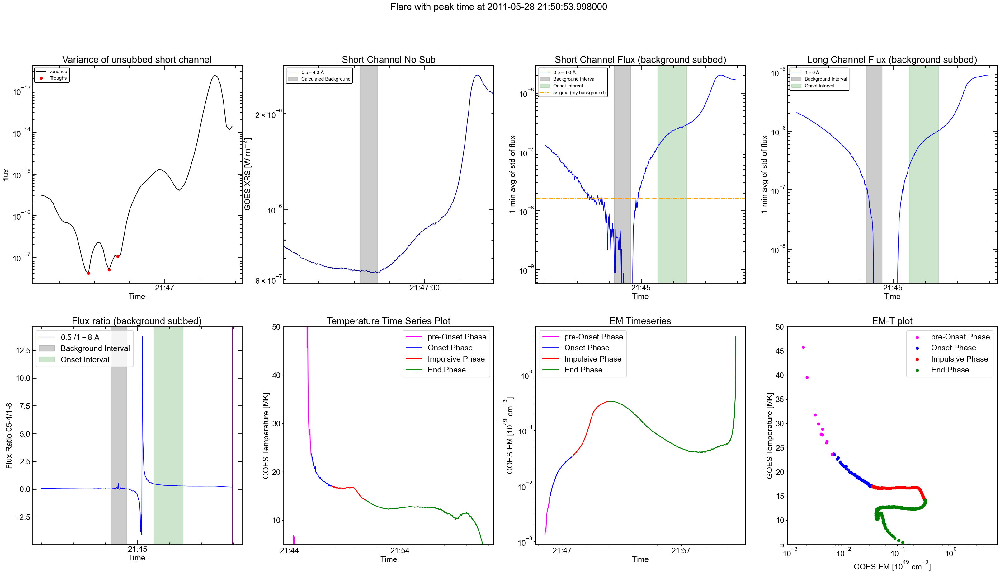

------------------------------
M1.4 Flare With Start Time: 2011-05-29 10:08:00.000
---------------------
No Suitable Background Detected... Using a 1 min window starting from start time
---------------------

T, EM at onset (using averaged flux): 12.91 MK and 0.12x10^49 cm^-3
T, EM at Peak: 11.95 MK and 0.74 x10^49 cm^-3



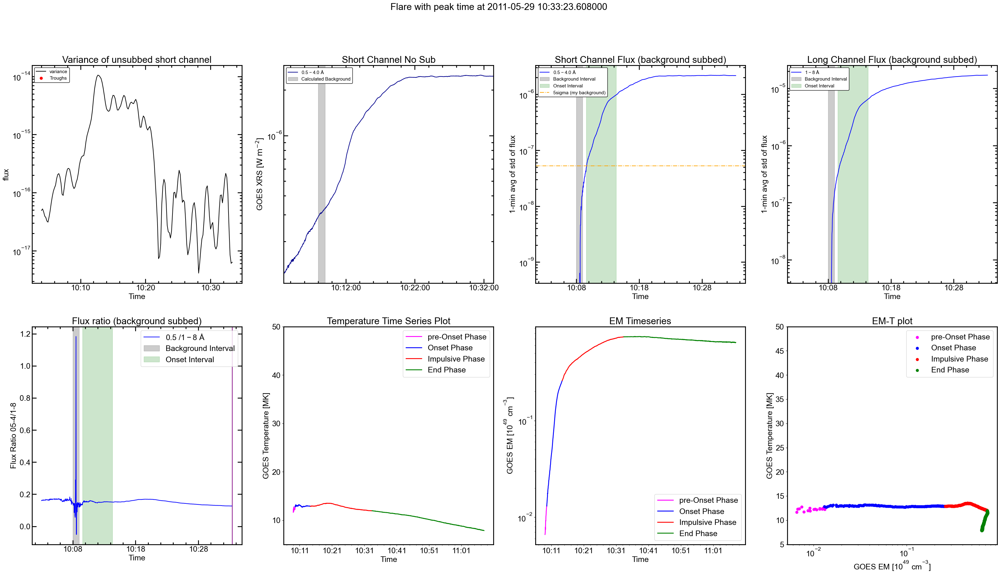

------------------------------
M1.4 Flare With Start Time: 2011-08-02 05:19:00.000

T, EM at onset (using averaged flux): 13.98 MK and 0.01x10^49 cm^-3
T, EM at Peak: 11.38 MK and 0.89 x10^49 cm^-3



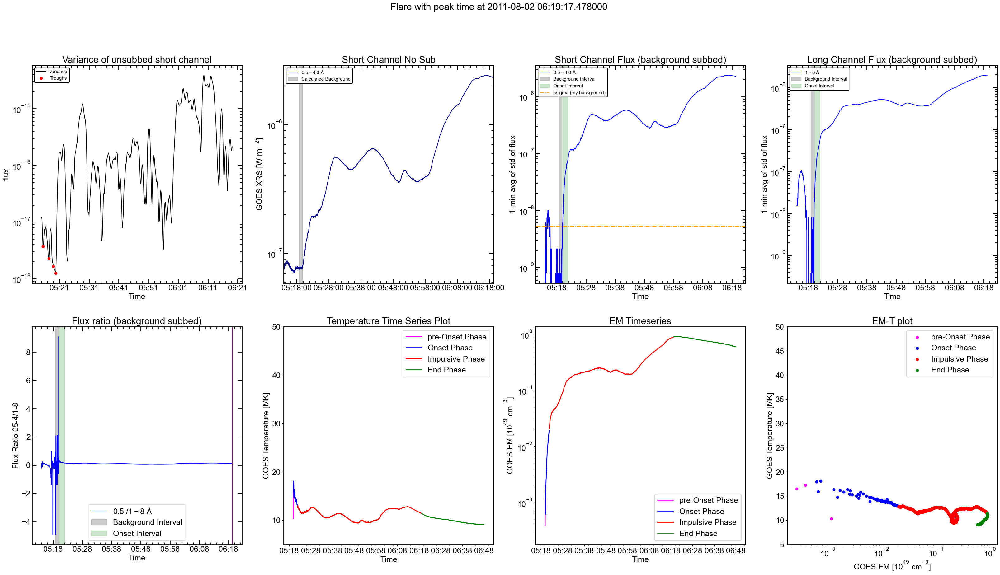

------------------------------
M1.1 Flare With Start Time: 2011-08-03 03:08:00.000

T, EM at onset (using averaged flux): 12.81 MK and 0.01x10^49 cm^-3
T, EM at Peak: 12.99 MK and 0.63 x10^49 cm^-3

------------------------------
M1.7 Flare With Start Time: 2011-08-03 04:29:00.000

Not enough troughs for located! To calculate onset!
Going to caculate the onset time to be the first 1/4 of the Impulsive Phase.

T, EM at onset (using averaged flux): 12.99 MK and 0.02x10^49 cm^-3
T, EM at Peak: 15.83 MK and 0.79 x10^49 cm^-3

------------------------------
M2.5 Flare With Start Time: 2011-08-09 03:19:00.000

T, EM at onset (using averaged flux): 10.60 MK and 0.00x10^49 cm^-3
T, EM at Peak: 14.27 MK and 1.34 x10^49 cm^-3

------------------------------
M2.5 Flare With Start Time: 2011-08-09 03:19:00.000

T, EM at onset (using averaged flux): 10.60 MK and 0.00x10^49 cm^-3
T, EM at Peak: 14.27 MK and 1.34 x10^49 cm^-3

------------------------------
M3.2 Flare With Start Time: 2011-09-04 11:2

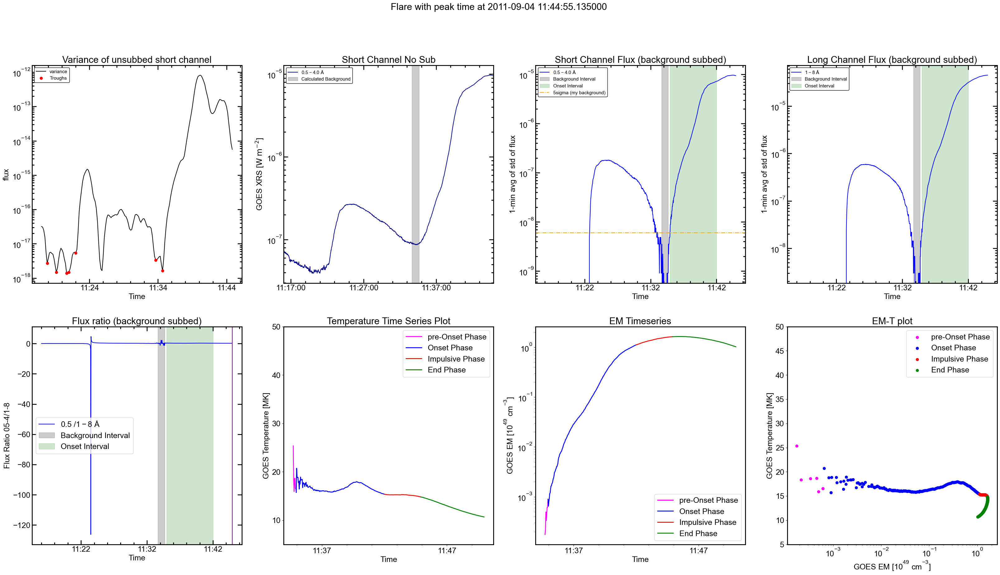

------------------------------
M1.6 Flare With Start Time: 2011-09-05 03:47:00.000

T, EM at onset (using averaged flux): 13.72 MK and 0.02x10^49 cm^-3
T, EM at Peak: 12.40 MK and 0.75 x10^49 cm^-3



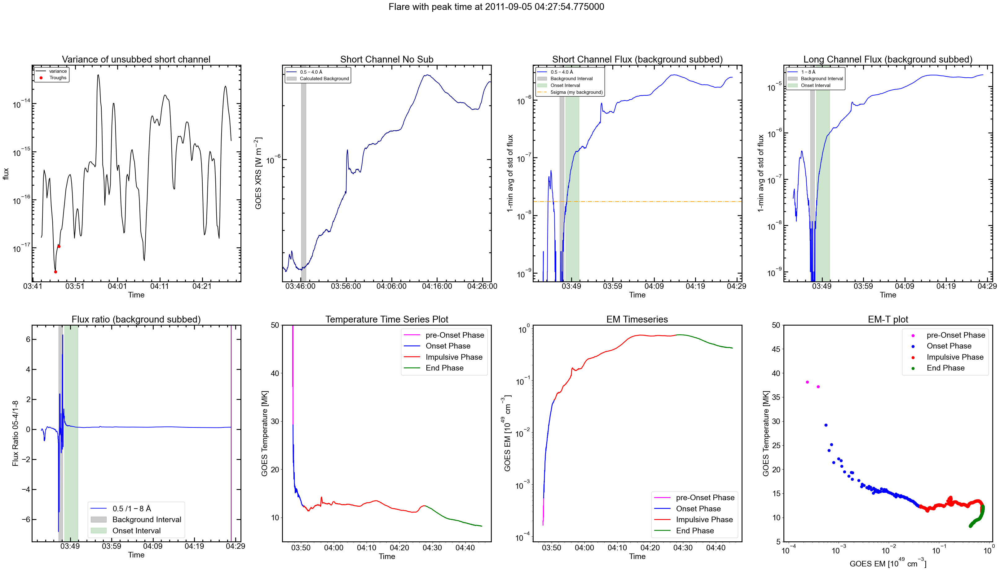

------------------------------
M5.3 Flare With Start Time: 2011-09-06 01:35:00.000

T, EM at onset (using averaged flux): 17.92 MK and 0.07x10^49 cm^-3
T, EM at Peak: 15.50 MK and 2.66 x10^49 cm^-3



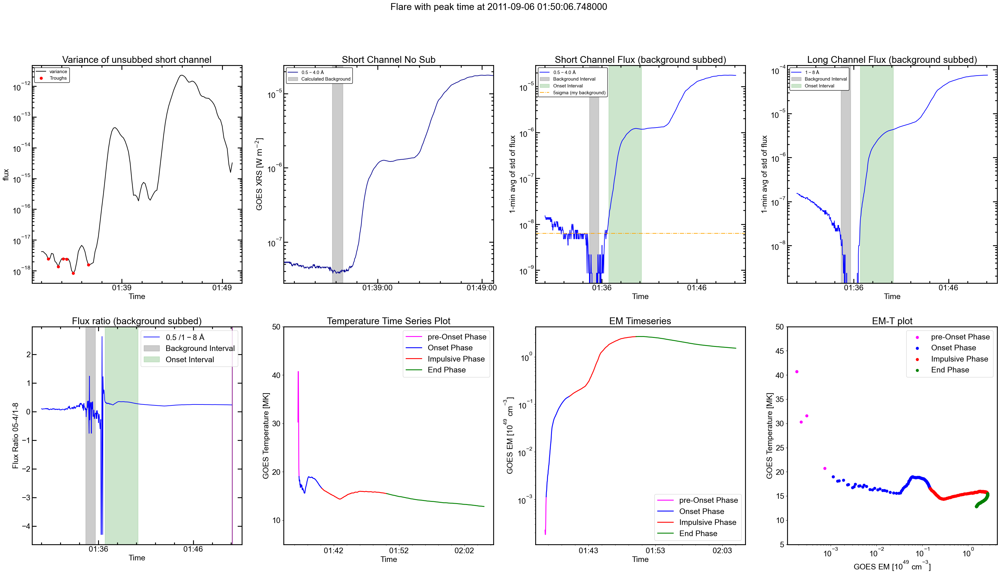

------------------------------
M1.1 Flare With Start Time: 2011-09-10 07:18:00.000

T, EM at onset (using averaged flux): 12.59 MK and 0.01x10^49 cm^-3
T, EM at Peak: 12.07 MK and 0.64 x10^49 cm^-3



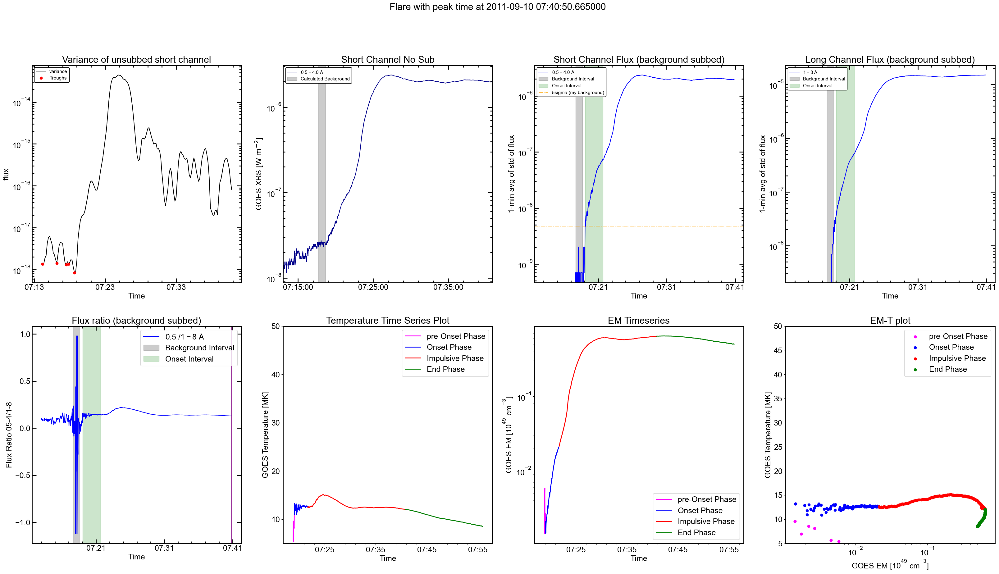

------------------------------
M1.8 Flare With Start Time: 2011-09-21 12:04:00.000

T, EM at onset (using averaged flux): 18.97 MK and 0.17x10^49 cm^-3
T, EM at Peak: 12.60 MK and 0.99 x10^49 cm^-3



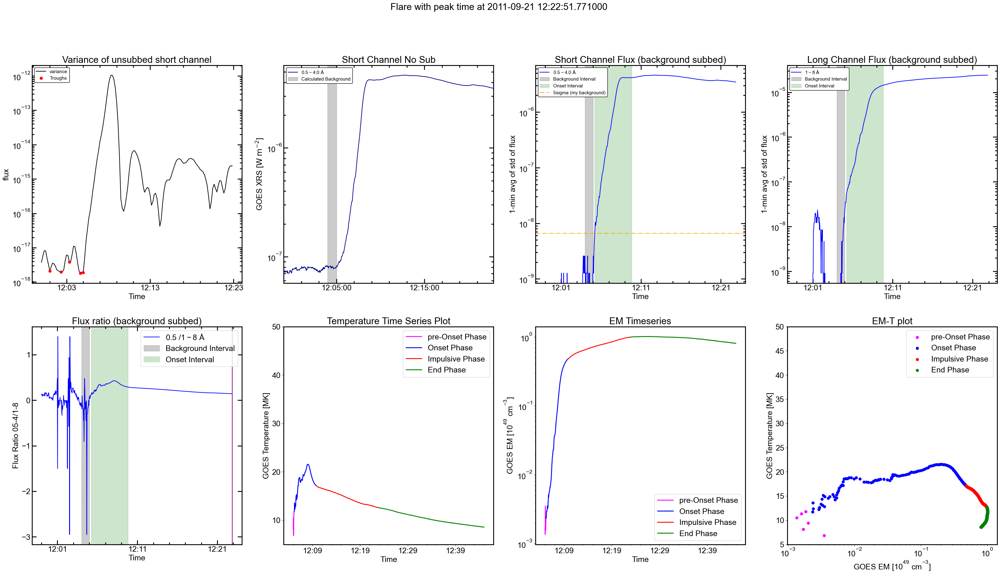

------------------------------
M1.8 Flare With Start Time: 2011-09-21 12:04:00.000

T, EM at onset (using averaged flux): 18.97 MK and 0.17x10^49 cm^-3
T, EM at Peak: 12.60 MK and 0.99 x10^49 cm^-3



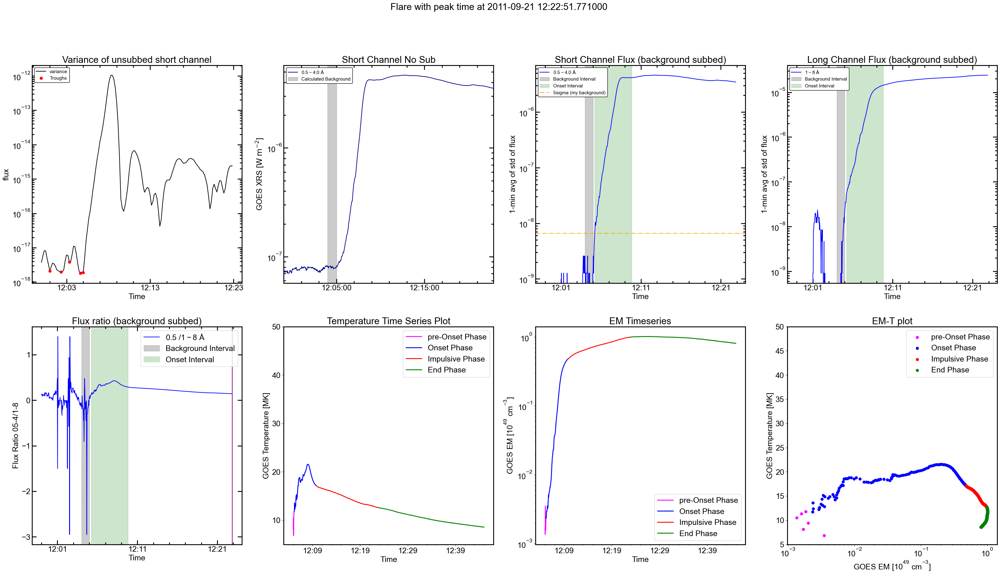

------------------------------
X1.4 Flare With Start Time: 2011-09-22 10:29:00.000

T, EM at onset (using averaged flux): 28.93 MK and 0.00x10^49 cm^-3
T, EM at Peak: 15.00 MK and 7.38 x10^49 cm^-3



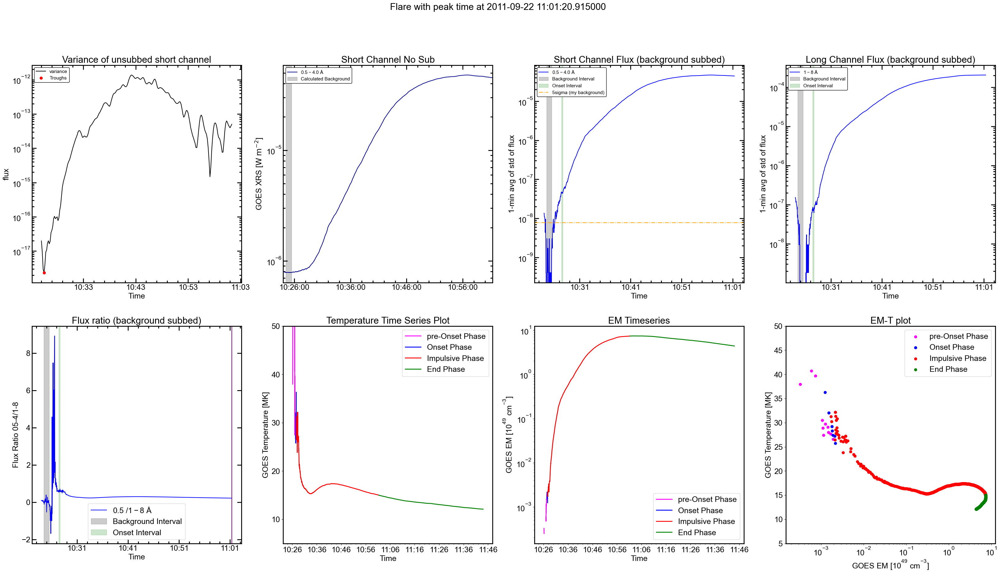

------------------------------
M1.6 Flare With Start Time: 2011-09-23 01:47:00.000

T, EM at onset (using averaged flux): 13.57 MK and 0.07x10^49 cm^-3
T, EM at Peak: 13.02 MK and 0.67 x10^49 cm^-3



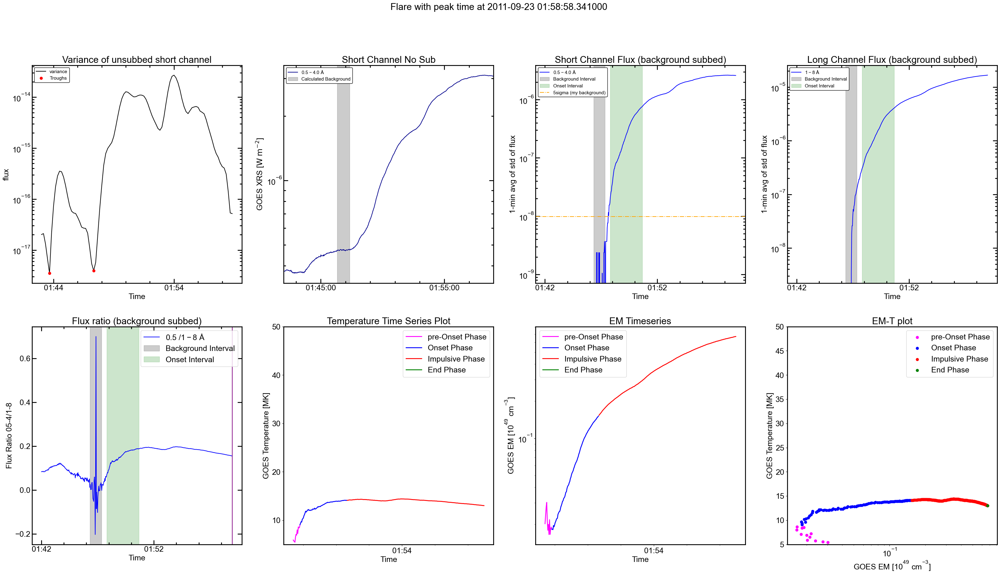

------------------------------
M7.1 Flare With Start Time: 2011-09-24 12:33:00.000

T, EM at onset (using averaged flux): 14.79 MK and 0.06x10^49 cm^-3
T, EM at Peak: 13.52 MK and 3.82 x10^49 cm^-3



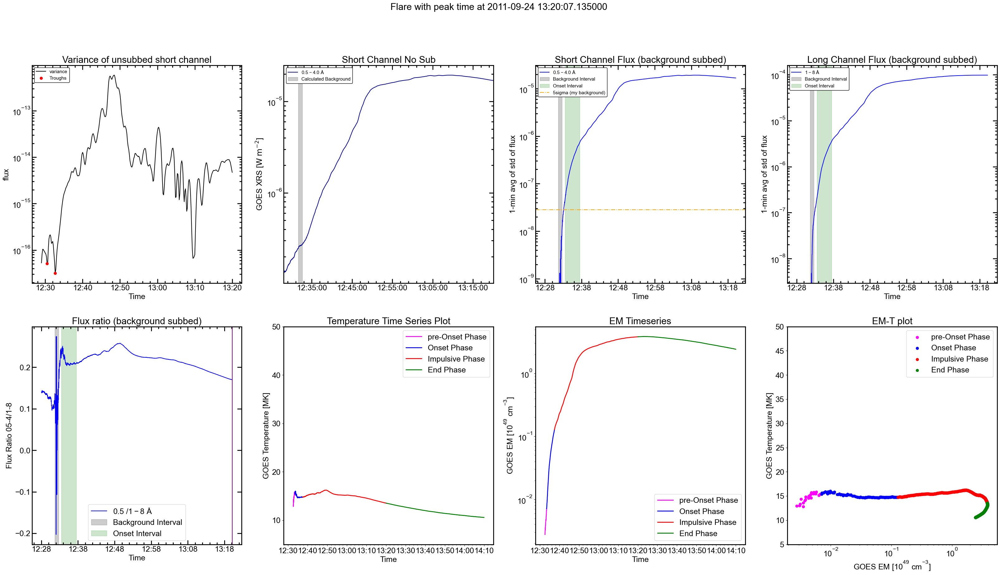

------------------------------
M1.8 Flare With Start Time: 2011-09-24 16:35:00.000

T, EM at onset (using averaged flux): 16.40 MK and 0.04x10^49 cm^-3
T, EM at Peak: 13.73 MK and 0.33 x10^49 cm^-3



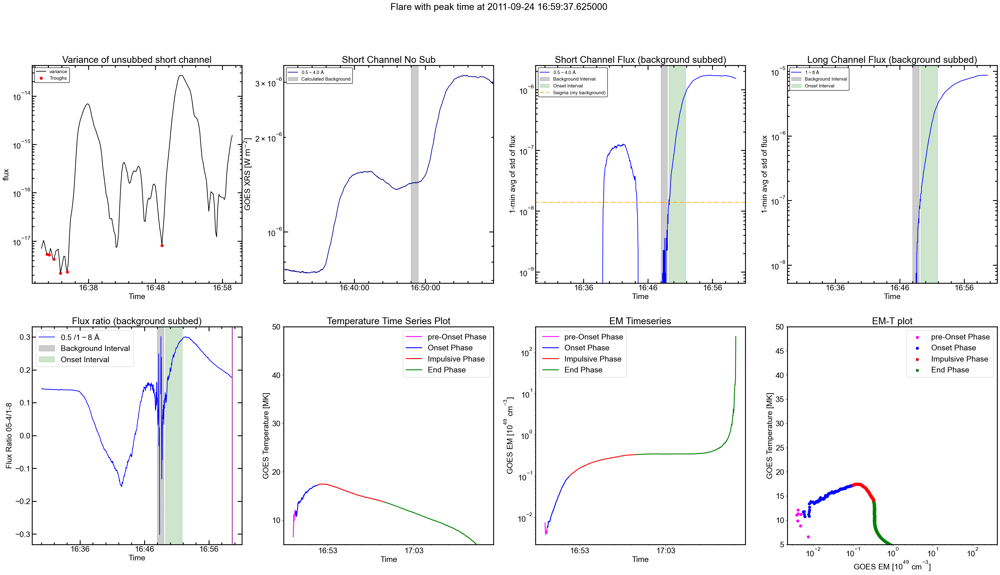

------------------------------
M3.1 Flare With Start Time: 2011-09-24 17:19:00.000

Not enough troughs for located! To calculate onset!
Going to caculate the onset time to be the first 1/4 of the Impulsive Phase.

T, EM at onset (using averaged flux): 19.11 MK and 0.13x10^49 cm^-3
T, EM at Peak: 14.91 MK and 1.05 x10^49 cm^-3



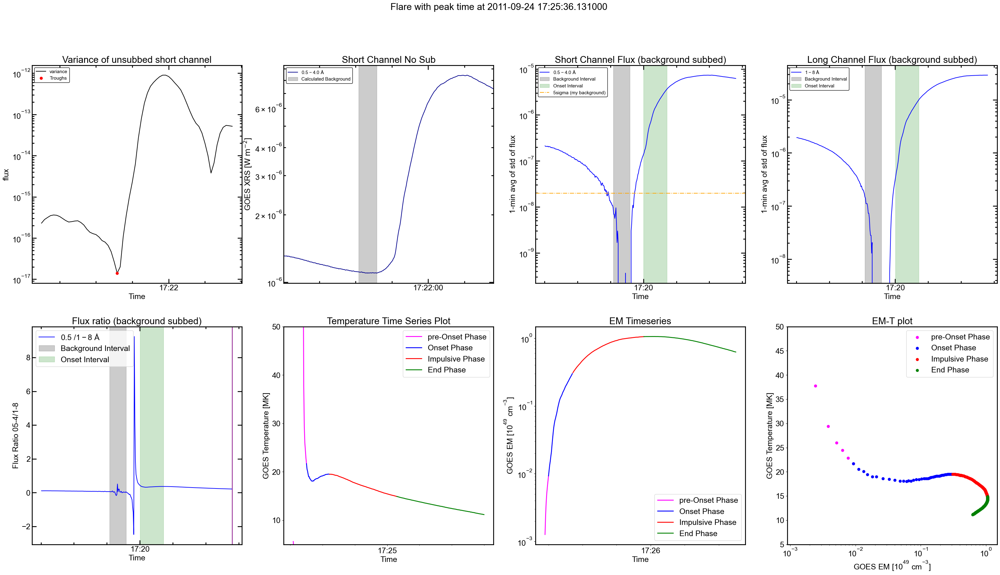

------------------------------
M3.0 Flare With Start Time: 2011-09-24 19:09:00.000

T, EM at onset (using averaged flux): 14.84 MK and 0.21x10^49 cm^-3
T, EM at Peak: 12.81 MK and 1.39 x10^49 cm^-3



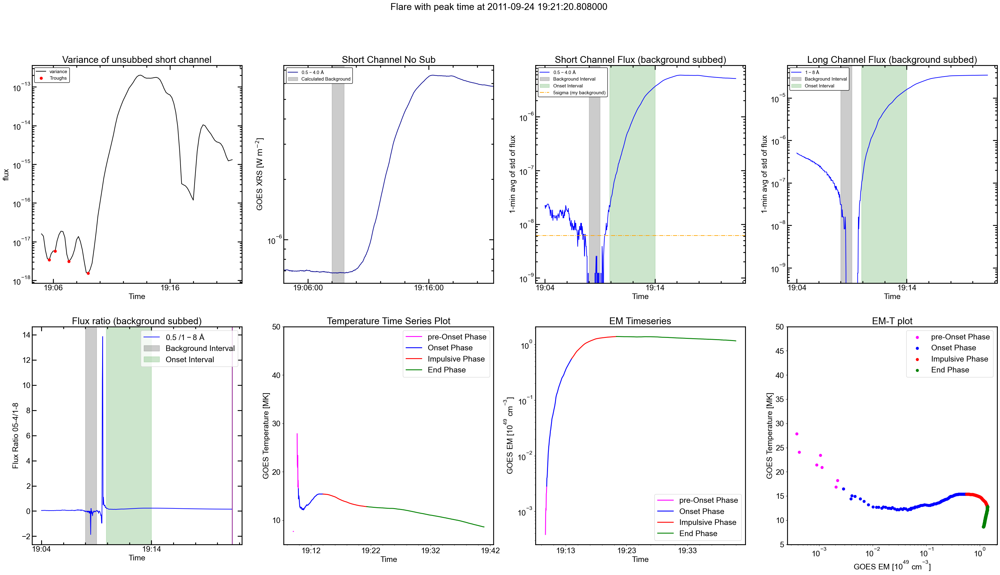

------------------------------
M1.0 Flare With Start Time: 2011-09-24 23:45:00.000

T, EM at onset (using averaged flux): 13.10 MK and 0.06x10^49 cm^-3
T, EM at Peak: 12.63 MK and 0.42 x10^49 cm^-3



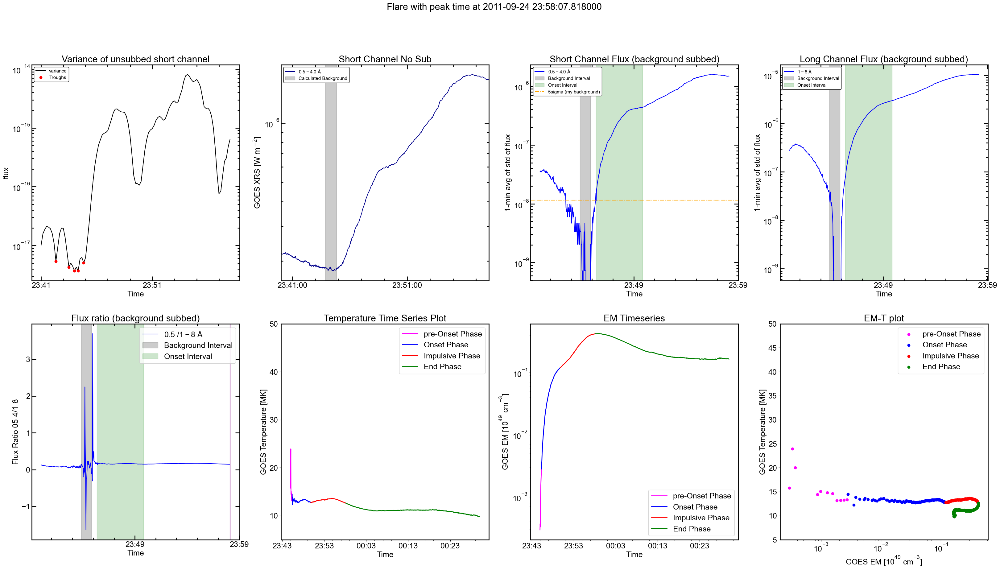

------------------------------
M3.1 Flare With Start Time: 2011-09-25 08:46:00.000

Not enough troughs for located! To calculate onset!
Going to caculate the onset time to be the first 1/4 of the Impulsive Phase.

T, EM at onset (using averaged flux): 16.30 MK and 0.02x10^49 cm^-3
T, EM at Peak: 16.44 MK and 1.31 x10^49 cm^-3

------------------------------
M1.5 Flare With Start Time: 2011-09-25 09:25:00.000

T, EM at onset (using averaged flux): 12.59 MK and 0.06x10^49 cm^-3
T, EM at Peak: 12.08 MK and 0.53 x10^49 cm^-3



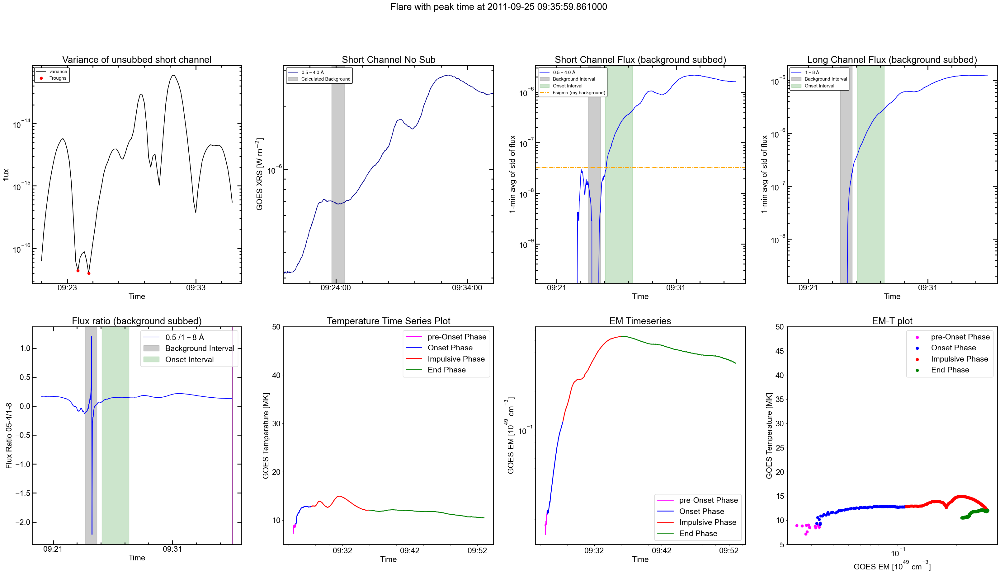

------------------------------
M1.0 Flare With Start Time: 2011-09-30 18:55:00.000

T, EM at onset (using averaged flux): 14.65 MK and 0.04x10^49 cm^-3
T, EM at Peak: 11.18 MK and 0.57 x10^49 cm^-3



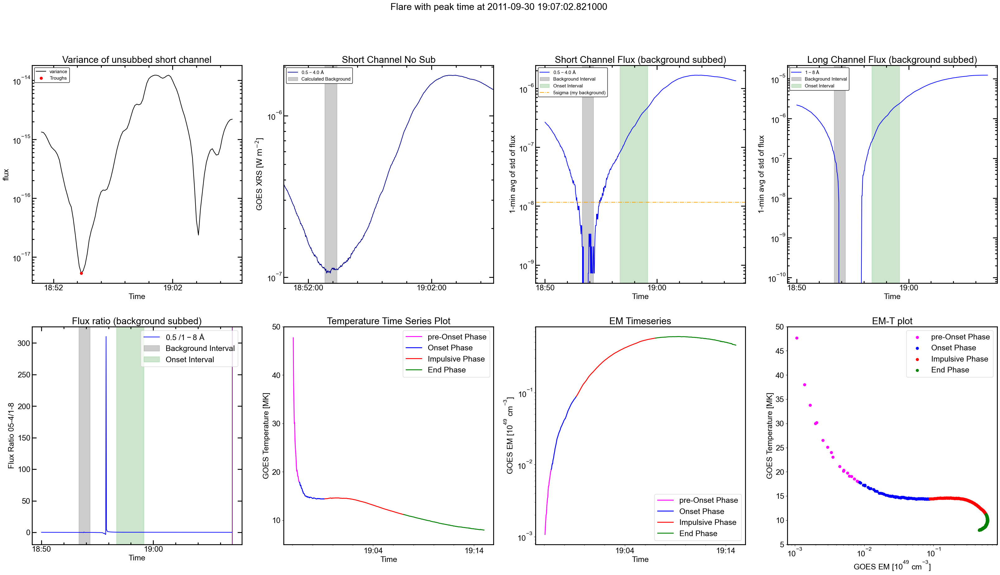

------------------------------
M1.6 Flare With Start Time: 2011-10-20 03:10:00.000

T, EM at onset (using averaged flux): 19.65 MK and 0.20x10^49 cm^-3
T, EM at Peak: 13.81 MK and 0.86 x10^49 cm^-3



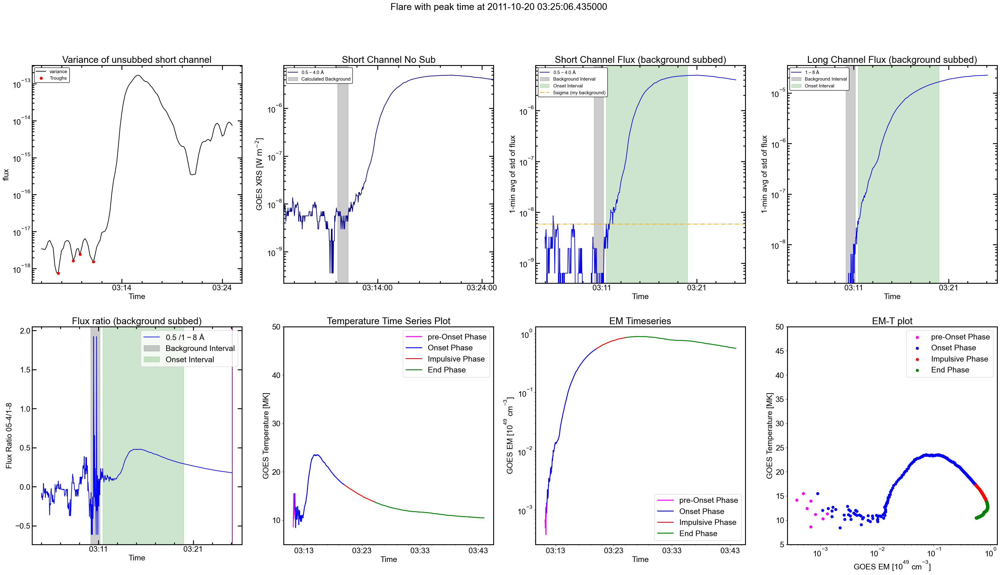

------------------------------
M1.3 Flare With Start Time: 2011-10-22 09:18:00.000

T, EM at onset (using averaged flux): 7.82 MK and 0.02x10^49 cm^-3
T, EM at Peak: 8.67 MK and 1.13 x10^49 cm^-3

------------------------------
M1.1 Flare With Start Time: 2011-10-31 14:55:00.000

T, EM at onset (using averaged flux): 22.68 MK and 0.05x10^49 cm^-3
T, EM at Peak: 16.28 MK and 0.48 x10^49 cm^-3



KeyboardInterrupt: 

In [48]:

count = 0
for index, row in odd_data.iterrows():
#   try:
    if row['fl_goescls'].__contains__("X") or row['fl_goescls'].__contains__("M"):
        fl_hek_start = row['event_starttime']
        fl_hek_end = row['event_endtime']
        fl_class = row['fl_goescls']

        flare_time=a.Time(Time(fl_hek_start, scale='utc').iso, Time(fl_hek_end,scale='utc').iso)
        day_string = flare_time.start.datetime.date().strftime("%Y%m%d")
        yr_str = flare_time.start.datetime.date().strftime("%Y")
        mnth_str = flare_time.start.datetime.date().strftime("%m")
        date_path = os.path.join(yr_str, mnth_str)
        fl_path = os.path.join(data_dir, date_path,f'*sci_gxrs-l2-irrad_g15_d*{day_string}*.nc')

        if Time(fl_hek_start).datetime.time() <= time(hour=1, minute=0, second=0):
            day_str_prev = (Time(fl_hek_start) - TimeDelta(1, format = 'jd')).datetime.date().strftime("%Y%m%d")
            fl_path_prev = os.path.join(data_dir, date_path,f'*sci_gxrs-l2-irrad_g15_d*{day_str_prev}*.nc')
            g15 = ts.TimeSeries([fl_path, fl_path_prev],concatenate=True)
        elif Time(fl_hek_start).datetime.time() >= time(hour=23, minute=0, second=0):
            day_str_post = (Time(fl_hek_start)+ TimeDelta(1, format = 'jd')).datetime.date().strftime("%Y%m%d")
            fl_path_post = os.path.join(data_dir, date_path,f'*sci_gxrs-l2-irrad_g15_d*{day_str_post}*.nc')
            g15 = ts.TimeSeries([fl_path, fl_path_post],concatenate=True)
        else:  
            g15 = ts.TimeSeries(fl_path, concatenate=True)

    # Load flare into time series
        g_tims = g15.index
        g_short = g15.quantity("xrsa").value 
        g_long = g15.quantity("xrsb").value
        g_short_flag = g15.quantity("xrsa_quality").value 
        g_long_flag = g15.quantity("xrsb_quality").value 

        # Create a Boolean mask where any flags are located
        mask_long = g_long_flag != 0
        mask_short = g_short_flag != 0

        # Set the corresponding values in g_short and g_long to NaN
        g_short[mask_short] = np.nan
        g_long[mask_long] = np.nan

        # Set sub-zero values not picked up by flags to nans
        mask_short_mask = g_short <= 0 
        g_short[mask_short_mask] = np.nan 

        #Load into dataframes
        df_long = pd.Series(g_long, index = pd.DatetimeIndex(g15.index))
        df_short = pd.Series(g_short, index = pd.DatetimeIndex(g15.index))
        

    # Printing for terminal
        print("------------------------------")
        print(f"{fl_class} Flare With Start Time: {fl_hek_start}")

        #Calculating background of non-backsubbed peak
        bcktrunc_18=df_long.truncate(flare_time.start.iso,flare_time.end.iso)
        old_peak = bcktrunc_18.idxmax()

    # Background Time Calculation Function
        #bckt, bcktrunc_054, bcktrunc_18, bckdata = background_2(df_short, df_long, start_time = Time(row['Start Time']), peak_time = Time(row['Peak Time']))
        bck_startt, bck_endt, smooth_bck, bck_tr_ts, bck_tr_vars, bck_flag = onsets.background(df_short, df_long, start_time = Time(fl_hek_start), peak_time = old_peak)
        srch_time = a.Time(Time(bck_startt, scale='utc').iso, Time(bck_endt,scale='utc').iso)
        trunc_054 = df_short.truncate(srch_time.start.iso,srch_time.end.iso)
        trunc_18 = df_long.truncate(srch_time.start.iso,srch_time.end.iso)
        bck_t = trunc_054.index
        bck_short = np.mean(trunc_054)
        bck_long = np.mean(trunc_18)
        bck_short_std = np.std(trunc_054)
        bck_long_std = np.std(trunc_18)

    # Background Subtracting the Data
        short_backsub = df_short - bck_short
        long_backsub = df_long - bck_long

    # Calculating true peak time (using backsubbed long channel flux)
        flare_long = long_backsub.truncate(flare_time.start.iso,flare_time.end.iso)
        long_peakt = flare_long.idxmax()
        flare_short = short_backsub.truncate(flare_time.start.iso,flare_time.end.iso)
        short_peakt = flare_short.idxmax()

        long_peakfl_18 = flare_long[long_peakt]
        long_peakfl_054 = flare_short[long_peakt]
        short_peakfl_18 = flare_long[short_peakt]
        short_peakfl_054 = flare_short[short_peakt]

        true_peak = long_peakt #Varaible change for old code

    # Calculating the first acceptable point of onset using backsubbed long channel
        srch_start = Time(bck_endt) - TimeDelta(60, format = 'sec')
        trange_search = a.Time(srch_start, true_peak)
        g_long_srch = long_backsub.truncate(trange_search.start.iso,trange_search.end.iso)
        g_short_srch = short_backsub.truncate(trange_search.start.iso,trange_search.end.iso)

        indexes = g_long_srch[(g_long_srch >= 4*bck_long_std) & (g_short_srch >= 4*bck_short_std)].index
        if len(indexes) == 0:
            raise ValueError
        else:
            first_index = indexes[0]

    # Onset and TEM Calculations of different onset definitions 
    # Lots of inefficient calculating going on here, but it makes it clearer to track the variables

        if first_index > bck_endt:
            onset_start = first_index
        else:
            onset_start = bck_endt                                                                               

        # Calcualting the time length of the each fractional onset interval, as well as the end time of that interval
        endt_eighth = onsets.scaled_onset(onset_start, true_peak, 8)
        timedelta_eighth = pd.to_timedelta(endt_eighth - onset_start).total_seconds()
        endt_sixth = onsets.scaled_onset(onset_start, true_peak, 6)
        timedelta_sixth = pd.to_timedelta(endt_sixth - onset_start).total_seconds()
        endt_quarter = onsets.scaled_onset(onset_start, true_peak, 4)
        timedelta_quarter = pd.to_timedelta(endt_quarter - onset_start).total_seconds()
        endt_third = onsets.scaled_onset(onset_start, true_peak, 3)
        timedelta_third = pd.to_timedelta(endt_third - onset_start).total_seconds()
        endt_half = onsets.scaled_onset(onset_start, true_peak, 2)
        timedelta_half = pd.to_timedelta(endt_half - onset_start).total_seconds()
        endt_twothirds = onsets.scaled_onset(onset_start, true_peak, 3/2)
        timedelta_twothirds = pd.to_timedelta(endt_twothirds - onset_start).total_seconds()
        endt_threequart = onsets.scaled_onset(onset_start, true_peak, 4/3)
        timedelta_threequart= pd.to_timedelta(endt_threequart - onset_start).total_seconds()

        # Calculating the temp and em for the onset of each fractional onset interval
        tmk_eighth, em_eighth = onsets.onset_tem(short_backsub, long_backsub, onset_start, endt_eighth)
        tmk_sixth, em_sixth = onsets.onset_tem(short_backsub, long_backsub, onset_start, endt_sixth)
        tmk_quarter, em_quarter = onsets.onset_tem(short_backsub, long_backsub, onset_start, endt_quarter)
        tmk_third, em_third = onsets.onset_tem(short_backsub, long_backsub, onset_start, endt_third)
        tmk_half, em_half = onsets.onset_tem(short_backsub, long_backsub, onset_start, endt_half)
        tmk_twothirds, em_twothirds = onsets.onset_tem(short_backsub, long_backsub, onset_start, endt_twothirds)
        tmk_threequart, em_threequart = onsets.onset_tem(short_backsub, long_backsub, onset_start, endt_threequart)

    # Using my 'fancy' method
        onset_start_fancy, onset_end_fancy, onset_flag = onsets.onset_times(short_backsub, onset_start, true_peak, 5*bck_short_std)
        try:
            timedelta_fancy = (onset_end_fancy - onset_start_fancy).total_seconds()
        except:
            timedelta_fancy = np.nan

        trunc_054_tem_fancy = np.mean(short_backsub.truncate(onset_start_fancy, onset_end_fancy))
        trunc_18_tem_fancy = np.mean(long_backsub.truncate(onset_start_fancy, onset_end_fancy))
        tmk_mnfancy, em_mnfancy = gtem.get_tem(trunc_18_tem_fancy, trunc_054_tem_fancy)

    # Calculating temperature at flare peak (long channel)
        trunc_054_tem_peakl = short_backsub[true_peak]
        trunc_18_tem_peakl = long_backsub[true_peak]
        tmk_peakl, em_peakl = gtem.get_tem(trunc_18_tem_peakl, trunc_054_tem_peakl)
        tmk_peakl = tmk_peakl
        em_peakl = em_peakl

    # Calculating max flare temperature
        trunc_054_tem_max = short_backsub.truncate(onset_end_fancy, Time(true_peak).datetime)
        trunc_18_tem_max = long_backsub.truncate(onset_end_fancy, Time(true_peak).datetime)
        tmk_maxx, em_maxx = gtem.get_tem(trunc_18_tem_max, trunc_054_tem_max)
        try:
            tmk_max = np.nanmax(tmk_maxx)
            tmk_max_index = np.idxmax(tmk_max)
            em_max = em_maxx[tmk_max_index]
        except:
            tmk_max = np.nan
            em_max = np.nan
    
    # Choosing which interval to use as onset_end

        onset_end = onset_end_fancy

    # Calculating TEM for end of background to end time [FOR PLOTTING ONLY]

        trunc_054_tem_pre = short_backsub.truncate(bck_endt, onset_start)
        trunc_18_tem_pre = long_backsub.truncate(bck_endt, onset_start)

        trunc_054_tem_onset = short_backsub.truncate(onset_start, onset_end)
        trunc_18_tem_onset = long_backsub.truncate(onset_start, onset_end)

        trunc_054_tem_imp = short_backsub.truncate(onset_end, Time(true_peak).datetime)
        trunc_18_tem_imp = long_backsub.truncate(onset_end, Time(true_peak).datetime)

        trunc_054_tem_end = short_backsub.truncate(Time(true_peak).datetime, Time(row['event_endtime']).datetime)
        trunc_18_tem_end = long_backsub.truncate(Time(true_peak).datetime, Time(row['event_endtime']).datetime)

        tmk_pre, em_pre = gtem.get_tem(trunc_18_tem_pre, trunc_054_tem_pre) 
        tmk, em = gtem.get_tem(trunc_18_tem_onset, trunc_054_tem_onset) 
        tmk_imp, em_imp = gtem.get_tem(trunc_18_tem_imp, trunc_054_tem_imp) 
        tmk_end, em_end = gtem.get_tem(trunc_18_tem_end, trunc_054_tem_end)   


    # calculating mean T, EM for backsubbed new data [FOR CALCULATING T,EM]
        tmk_avgedfl, em_avgedfl = gtem.get_tem(np.mean(trunc_18_tem_onset), np.mean(trunc_054_tem_onset))
        tmk_peakfl, em_peakfl = gtem.get_tem(long_peakfl_18, long_peakfl_054)

        print("")
        print('T, EM at onset (using averaged flux): {0:.2f} MK and {1:.2f}x10^49 cm^-3'.format(tmk_avgedfl, em_avgedfl*1e-49))
        print('T, EM at Peak: {0:.2f} MK and {1:.2f} x10^49 cm^-3'.format(tmk_peakfl, em_peakfl*1e-49))
        print("")


        # Plotting
        # Truncate data to range (5 mins before start time till peak time)

        if tmk_avgedfl >= tmk_peakfl:
            count = count + 1
            bcktime, bcktrunc_054, bcktrunc_18 = onsets.bck_truncate(short_backsub, long_backsub, Time(row['event_starttime']), 600, 0)
            trunc_time, trunc_054, trunc_18 = onsets.bck_truncate(df_short, df_long, Time(row['event_starttime']), 600, 0)
            trunc_054_p = short_backsub.truncate((Time(row['event_starttime'], scale = 'utc') - TimeDelta(300, format='sec')).iso, Time(true_peak, scale = 'utc').iso)
            trunc_18_p = long_backsub.truncate((Time(row['event_starttime'], scale = 'utc') - TimeDelta(300, format='sec')).iso, Time(true_peak, scale = 'utc').iso)
            trunc_054_z = df_short.truncate((Time(row['event_starttime'], scale = 'utc') - TimeDelta(300, format='sec')).iso, Time(true_peak, scale = 'utc').iso)
            
            fig= plt.figure(figsize=(40, 20))
            fig.suptitle(f'Flare with peak time at {true_peak}')
            #background Loacator graph
            ax_bck = fig.add_subplot(2,4,1)
            ax_bck.plot(smooth_bck.index, smooth_bck['Variance'], color = 'black', label = 'variance')
            ax_bck.plot(bck_tr_ts, bck_tr_vars, 'o', color = 'red', label = 'Troughs')
            ax_bck.set_title("Variance of unsubbed short channel")
            ax_bck.set_ylabel("flux")
            ax_bck.set_xlabel("Time")
            ax_bck.set_yscale("log")
            myFmt = matplotlib.dates.DateFormatter('%H:%M')
            majorx= matplotlib.dates.MinuteLocator(interval=10)
            minorx= matplotlib.dates.MinuteLocator(interval=2)
            ax_bck.xaxis.set_major_locator(majorx)
            ax_bck.xaxis.set_minor_locator(minorx)
            ax_bck.xaxis.set_major_formatter(myFmt)
            ax_bck.tick_params('both', which='major', size=10, width=2, direction='in', top='on')
            ax_bck.tick_params('both', which='minor', size=5, width=2, direction='in', top='on')
            ax_bck.tick_params(which='major', size=10, width=2, direction='in', right='on')
            ax_bck.tick_params(which='minor', size=5, width=2, direction='in', right='on')
            ax_bck.legend(fancybox = True, loc = "upper left", fontsize = 11, framealpha = 1, edgecolor = 'black')

        # Short Channel XRS Flux no backsub
            ax_short = fig.add_subplot(2, 4, 2)
            ax_short.plot(trunc_054_z.index, trunc_054_z, color = 'darkblue', label = r"$0.5-4.0\;\AA$")
            ax_short.axvspan(bck_startt, bck_endt, color='black',alpha=0.2, label = 'Calculated Background')
            # ax_short.axvline(Time(row["Start Time"]).datetime,ls='-.',color = 'red',label = "start time")
            ax_short.set_title("Short Channel No Sub")
            ax_short.set_ylabel("GOES XRS [$\mathrm{W\;m^{-2}}$]")
            ax_short.set_xlim(min(trunc_054_z.index), max(trunc_054_z.index))
            ax_short.set_yscale("log")
            myFmt = matplotlib.dates.DateFormatter('%H:%M:%S')
            majorx= matplotlib.dates.MinuteLocator(interval= 10)
            minorx= matplotlib.dates.MinuteLocator(interval=2)
            ax_short.xaxis.set_major_locator(majorx)
            ax_short.xaxis.set_minor_locator(minorx)
            ax_short.xaxis.set_major_formatter(myFmt)
            ax_short.tick_params('both', which='major', size=10, width=2, direction='in', top='on')
            ax_short.tick_params('both', which='minor', size=5, width=2, direction='in', top='on')
            ax_short.tick_params(which='major', size=10, width=2, direction='in', right='on')
            ax_short.tick_params(which='minor', size=5, width=2, direction='in', right='on')
            ax_short.legend(fancybox = True, loc = "upper left", fontsize = 11, framealpha = 1, edgecolor = 'black')


        # Short channel Flux Plot showing background and onset windows
            ax_final = fig.add_subplot(2, 4, 3)
            ax_final.set_title('Short Channel Flux (background subbed)')
            ax_final.plot(trunc_054_p.index, trunc_054_p, color = 'blue', label = r"$0.5-4.0\;\AA$")
            #ax_final.plot(np.sqrt(smooth_onset), color = 'black', label = 'Standard dev.')
            ax_final.axvspan(bck_startt, bck_endt, color='black',alpha=0.2, label = 'Background Interval')
            ax_final.axvspan(onset_start, onset_end, color = 'green', alpha = 0.2, label = 'Onset Interval')
            ax_final.axhline(5*bck_short_std, color = 'Orange',ls = '-.' ,label = '5sigma (my background)')
            ax_final.set_ylabel("1-min avg of std of flux")
            ax_final.set_xlabel("Time")
            ax_final.set_yscale("log")
            myFmt = matplotlib.dates.DateFormatter('%H:%M')
            majorx= matplotlib.dates.MinuteLocator(interval=10)
            minorx= matplotlib.dates.MinuteLocator(interval=2)
            ax_final.xaxis.set_major_locator(majorx)
            ax_final.xaxis.set_minor_locator(minorx)
            ax_final.xaxis.set_major_formatter(myFmt)
            ax_final.tick_params('both', which='major', size=10, width=2, direction='in', top='on')
            ax_final.tick_params('both', which='minor', size=5, width=2, direction='in', top='on')
            ax_final.tick_params(which='major', size=10, width=2, direction='in', right='on')
            ax_final.tick_params(which='minor', size=5, width=2, direction='in', right='on')
            ax_final.legend(fancybox = True, loc = "upper left", fontsize = 11, framealpha = 1, edgecolor = 'black')

        #Long channel flux plot
            ax_longfl = fig.add_subplot(2, 4, 4)
            ax_longfl.set_title('Long Channel Flux (background subbed)')
            ax_longfl.plot(trunc_18_p.index, trunc_18_p, color = 'blue', label = r"$1-8\;\AA$")
            #ax_final.plot(np.sqrt(smooth_onset), color = 'black', label = 'Standard dev.')
            ax_longfl.axvspan(bck_startt, bck_endt, color='black',alpha=0.2, label = 'Background Interval')
            ax_longfl.axvspan(onset_start, onset_end, color = 'green', alpha = 0.2, label = 'Onset Interval')
            #ax_longfl.axhline(5*bck_short_std, color = 'Orange',ls = '-.' ,label = '5sigma (my background)')
            ax_longfl.set_ylabel("1-min avg of std of flux")
            ax_longfl.set_xlabel("Time")
            ax_longfl.set_yscale("log")
            myFmt = matplotlib.dates.DateFormatter('%H:%M')
            majorx= matplotlib.dates.MinuteLocator(interval=10)
            minorx= matplotlib.dates.MinuteLocator(interval=2)
            ax_longfl.xaxis.set_major_locator(majorx)
            ax_longfl.xaxis.set_minor_locator(minorx)
            ax_longfl.xaxis.set_major_formatter(myFmt)
            ax_longfl.tick_params('both', which='major', size=10, width=2, direction='in', top='on')
            ax_longfl.tick_params('both', which='minor', size=5, width=2, direction='in', top='on')
            ax_longfl.tick_params(which='major', size=10, width=2, direction='in', right='on')
            ax_longfl.tick_params(which='minor', size=5, width=2, direction='in', right='on')
            ax_longfl.legend(fancybox = True, loc = "upper left", fontsize = 11, framealpha = 1, edgecolor = 'black')

        # Flux ratio vs time
            ax_ratio = fig.add_subplot(2, 4, 5)
            ax_ratio.set_title('Flux ratio (background subbed)')
            ax_ratio.plot(trunc_18_p.index, np.divide(trunc_054_p,trunc_18_p), color = 'blue', label = r"$0.5\;/1-8\;\AA$")
            #ax_final.plot(np.sqrt(smooth_onset), color = 'black', label = 'Standard dev.')
            ax_ratio.axvspan(bck_startt, bck_endt, color='black',alpha=0.2, label = 'Background Interval')
            ax_ratio.axvspan(onset_start, onset_end, color = 'green', alpha = 0.2, label = 'Onset Interval')
            ax_ratio.set_ylabel("Flux Ratio 05-4/1-8")
            ax_ratio.set_xlabel("Time")
            ax_ratio.axvline(true_peak, color = 'Purple')
            #ax_ratio.set_yscale("log")
            myFmt = matplotlib.dates.DateFormatter('%H:%M')
            majorx= matplotlib.dates.MinuteLocator(interval=10)
            minorx= matplotlib.dates.MinuteLocator(interval=2)
            ax_ratio.xaxis.set_major_locator(majorx)
            ax_ratio.xaxis.set_minor_locator(minorx)
            ax_ratio.xaxis.set_major_formatter(myFmt)
            ax_ratio.tick_params('both', which='major', size=10, width=2, direction='in', top='on')
            ax_ratio.tick_params('both', which='minor', size=5, width=2, direction='in', top='on')
            ax_ratio.tick_params(which='major', size=10, width=2, direction='in', right='on')
            ax_ratio.tick_params(which='minor', size=5, width=2, direction='in', right='on')
            ax_ratio.legend()


        # Temperature vs Time
            ax1 = fig.add_subplot(2, 4, 6)
            ax1.plot(trunc_054_tem_pre.index, tmk_pre, marker=None,color='magenta',lw=2, label = 'pre-Onset Phase')
            ax1.plot(trunc_054_tem_onset.index, tmk, marker=None,color='blue',lw=2, label = 'Onset Phase')
            ax1.plot(trunc_054_tem_imp.index, tmk_imp, marker=None,color='red',lw=2, label = 'Impulsive Phase')
            ax1.plot(trunc_054_tem_end.index, tmk_end, marker=None,color='green',lw=2, label = 'End Phase')
            #ax1.axvline(true_peak_short, color = 'Purple', label = 'Peak')
            ax1.set_title("Temperature Time Series Plot")
            ax1.set_ylabel("GOES Temperature [MK]")
            ax1.set_xlabel("Time")
            ax1.set_ylim([5,50])
            ax1.yaxis.set_major_locator(plt.MaxNLocator(5))
            #ax1.set_xlim([trange_small.start.datetime,trange_small.end.datetime])
            myFmt = matplotlib.dates.DateFormatter('%H:%M')
            majorx= matplotlib.dates.MinuteLocator(interval=10)
            minorx= matplotlib.dates.MinuteLocator(interval=2)
            ax1.xaxis.set_major_locator(majorx)
            ax1.xaxis.set_minor_locator(minorx)
            ax1.xaxis.set_major_formatter(myFmt)
            plt.legend()

        # EM vs Time
            ax2 = fig.add_subplot(2, 4, 7)
            ax2.plot(trunc_054_tem_pre.index, em_pre*1e-49, marker=None,color='magenta',lw=2, label = 'pre-Onset Phase')
            ax2.plot(trunc_054_tem_onset.index, em*1e-49,marker=None,color='blue',lw=2, label = 'Onset Phase') 
            ax2.plot(trunc_054_tem_imp.index, em_imp*1e-49,marker=None,color='red',lw=2, label = 'Impulsive Phase')
            ax2.plot(trunc_054_tem_end.index, em_end*1e-49, marker=None,color='green',lw=2, label = 'End Phase')
        # ax2.axvline(true_peak_short, color = 'Purple')
            ax2.set_title("EM Timeseries")
            ax2.set_ylabel("GOES EM [$10^{49}\;cm^{-3}$]")
            ax2.set_xlabel("Time")
            #ax2.set_ylim([1e-3,1e1])
            ax2.set_yscale("log")
            # ax2.set_xlim([trange_small.start.datetime,trange_small.end.datetime])
            myFmt = matplotlib.dates.DateFormatter('%H:%M')
            majorx= matplotlib.dates.MinuteLocator(interval=10)
            minorx= matplotlib.dates.MinuteLocator(interval=2)
            ax2.xaxis.set_major_locator(majorx)
            ax2.xaxis.set_minor_locator(minorx)
            ax2.xaxis.set_major_formatter(myFmt)
            plt.legend()

            # EM vs Temperature
            ax3 = fig.add_subplot(2, 4, 8)
            ax3.scatter(em_pre*1e-49, tmk_pre, marker = None, color = 'magenta', label = 'pre-Onset Phase')
            ax3.scatter(em*1e-49, tmk, marker = None, color = 'blue', label = 'Onset Phase')
            ax3.scatter(em_imp*1e-49,tmk_imp,marker=None,color='red', label = 'Impulsive Phase')
            ax3.scatter(em_end*1e-49,tmk_end,marker=None,color='green', label = 'End Phase')
            ax3.set_title("EM-T plot")
            ax3.set_xlabel("GOES EM [$10^{49}\;cm^{-3}$]")
            ax3.set_ylabel("GOES Temperature [MK]")
            ax3.set_xscale("log")
            majorx= matplotlib.dates.MinuteLocator(interval=10)
            minorx= matplotlib.dates.MinuteLocator(interval=2)
            #ax3.set_xlim([1e-3,1e1])
            ax3.set_ylim([5,50])
            plt.legend()
            plt.show()
            
# except ValueError:
#     continue

In [ ]:
print(count)

0


In [ ]:
x = 0
for index, row in odd_data.iterrows():
    if row['fl_goescls'].__contains__("X") or row['fl_goescls'].__contains__("M"):
        x = x +1

print(x)

0
